In [128]:
from tensorflow_docs.vis import embed
from tensorflow import keras
from imutils import paths

import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os

In [129]:
import os
os.add_dll_directory("C:/Program Files/NVIDIA GPU Computing Toolkit/CUDA/v11.2/bin")

<AddedDllDirectory('C:/Program Files/NVIDIA GPU Computing Toolkit/CUDA/v11.2/bin')>

In [130]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [131]:
IMG_SIZE = 500  # video frame will be resized to this.
BATCH_SIZE = 64 # number to frame to process at ones
EPOCHS = 50 # number of complete forward and back propagation in model training

MAX_SEQ_LENGTH = 512 # maximum sequence of frame to use
NUM_FEATURES = 2048 # no of features to extract from base model

In [132]:
train_df = pd.read_csv("train.csv")
test_df = pd.read_csv("test.csv")

print(f"Total videos for training: {len(train_df)}")
print(f"Total videos for testing: {len(test_df)}")

train_df.sample(4)

Total videos for training: 40
Total videos for testing: 16


,video_name,tag
37,Rotate_Rd_Kinect_Rgb3.m4v,Rotate
14,Open_Hd_Kinect_Rgb5.m4v,Open
5,Drop_Rd_Kinect_Rgb1.m4v,Drop
35,Rotate_Rd_Kinect_Rgb1.m4v,Rotate


In [133]:
def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y : start_y + min_dim, start_x : start_x + min_dim]


def load_video(path, max_frames=0, resize=(IMG_SIZE, IMG_SIZE)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)

            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

In [134]:
def build_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")


feature_extractor = build_feature_extractor()

In [135]:
label_processor = keras.layers.StringLookup(
    num_oov_indices=0, vocabulary=np.unique(train_df["tag"])
)
print(label_processor.get_vocabulary())

['Drop', 'Open', 'Pour', 'Rotate']


In [136]:
from IPython.display import clear_output

def prepare_all_videos(df, root_dir):
    num_samples = len(df)
    video_paths = df["video_name"].values.tolist()
    labels = df["tag"].values
    labels = label_processor(labels[..., None]).numpy()

    # `frame_masks` and `frame_features` are what we will feed to our sequence model.
    # `frame_masks` will contain a bunch of booleans denoting if a timestep is
    # masked with padding or not.
    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    # For each video.
    for idx, path in enumerate(video_paths):
        print(idx , len(video_paths))
        clear_output(wait=True)
        
        # Gather all its frames and add a batch dimension.
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]

        # Initialize placeholders to store the masks and features of the current video.
        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_features = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
        )

        # Extract features from the frames of the current video.
        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                temp_frame_features[i, j, :] = feature_extractor.predict(
                    batch[None, j, :]
                )
            temp_frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

        frame_features[idx,] = temp_frame_features.squeeze()
        frame_masks[idx,] = temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels


train_data, train_labels = prepare_all_videos(train_df, "train")
test_data, test_labels = prepare_all_videos(test_df, "test")

print(f"Frame features in train set: {train_data[0].shape}")
print(f"Frame masks in train set: {train_data[1].shape}")

Frame features in train set: (40, 512, 2048)
Frame masks in train set: (40, 512)


In [137]:
train_data

(array([[[0.09256817, 0.07259231, 0.05961108, ..., 0.08826835,
          0.10700765, 0.22491564],
         [0.0722907 , 0.08477768, 0.06458721, ..., 0.04285777,
          0.05930538, 0.20255573],
         [0.06738843, 0.080079  , 0.08686345, ..., 0.09513734,
          0.04438603, 0.19002292],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ]],
 
        [[0.02249135, 0.08867083, 0.24335772, ..., 0.09755237,
          0.01331086, 0.4002025 ],
         [0.02017853, 0.08803839, 0.22644857, ..., 0.09553082,
          0.04300793, 0.34770638],
         [0.0238384 , 0.1002718 , 0.259329  , ..., 0.08835685,
          0.04421018, 0.46584266],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.

In [138]:
test_data

(array([[[0.01791793, 0.04353989, 0.17965533, ..., 0.07188743,
          0.12019282, 0.15597108],
         [0.0351111 , 0.05888935, 0.19633834, ..., 0.07610524,
          0.10530967, 0.15992051],
         [0.02231474, 0.10071707, 0.23028488, ..., 0.06009501,
          0.0736977 , 0.23952337],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ],
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.        ]],
 
        [[0.02288762, 0.1639736 , 0.13035187, ..., 0.03462443,
          0.01675913, 0.01987961],
         [0.01664098, 0.14470111, 0.1179711 , ..., 0.00927579,
          0.01228897, 0.03159825],
         [0.02272758, 0.1861699 , 0.11182028, ..., 0.01155171,
          0.01633118, 0.0574647 ],
         ...,
         [0.        , 0.        , 0.        , ..., 0.        ,
          0.        , 0.

In [139]:
import pickle

file_to_store = open("train_data.pickle", "wb")
pickle.dump(train_data, file_to_store)
file_to_store.close()

file_to_store = open("train_labels.pickle", "wb")
pickle.dump(train_labels, file_to_store)
file_to_store.close()

file_to_store = open("test_data.pickle", "wb")
pickle.dump(test_data, file_to_store)
file_to_store.close()

file_to_store = open("test_labels.pickle", "wb")
pickle.dump(test_labels, file_to_store)
file_to_store.close()

In [140]:
file_to_read = open("train_data.pickle", "rb")
train_data = pickle.load(file_to_read)
file_to_read.close()

file_to_read = open("train_labels.pickle", "rb")
train_labels = pickle.load(file_to_read)
file_to_read.close()

file_to_read = open("test_data.pickle", "rb")
test_data = pickle.load(file_to_read)
file_to_read.close()

file_to_read = open("test_labels.pickle", "rb")
test_labels = pickle.load(file_to_read)
file_to_read.close()

In [152]:
# Utility for our sequence model.
def get_sequence_model():
    class_vocab = label_processor.get_vocabulary()

    frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
    mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype="bool")

    # Refer to the following tutorial to understand the significance of using `mask`:
    # https://keras.io/api/layers/recurrent_layers/gru/
    x = keras.layers.GRU(32, return_sequences=True)(
        frame_features_input, mask=mask_input
    )
    x = keras.layers.GRU(32)(x)
    x = keras.layers.Dropout(0.4)(x)
    x = keras.layers.Dense(32, activation="relu")(x)
    x = keras.layers.Dense(32, activation="relu")(x)
    output = keras.layers.Dense(len(class_vocab), activation="softmax")(x)

    rnn_model = keras.Model([frame_features_input, mask_input], output)

    rnn_model.compile(
        loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"]
    )
    return rnn_model


# Utility for running experiments.
def run_experiment():
    filepath = "video_classifier_model"
    checkpoint = keras.callbacks.ModelCheckpoint(
        filepath, save_weights_only=True, save_best_only=True, verbose=1
    )

    seq_model = get_sequence_model()
    history = seq_model.fit(
        [train_data[0], train_data[1]],
        train_labels,
        validation_split=0.3,
        epochs=EPOCHS,
        callbacks=[checkpoint],
    )

    seq_model.load_weights(filepath)
    _, accuracy = seq_model.evaluate([test_data[0], test_data[1]], test_labels)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")

    return history, seq_model


history, sequence_model = run_experiment()

Epoch 1/50
1/1 [==============================] - ETA: 0s - loss: 1.3430 - accuracy: 0.3929
Epoch 1: val_loss improved from inf to 1.69881, saving model to video_classifier_model
1/1 [==============================] - 9s 9s/step - loss: 1.3430 - accuracy: 0.3929 - val_loss: 1.6988 - val_accuracy: 0.0000e+00
Epoch 2/50
1/1 [==============================] - ETA: 0s - loss: 1.2707 - accuracy: 0.3929
Epoch 2: val_loss did not improve from 1.69881
1/1 [==============================] - 0s 209ms/step - loss: 1.2707 - accuracy: 0.3929 - val_loss: 1.9162 - val_accuracy: 0.0000e+00
Epoch 3/50
1/1 [==============================] - ETA: 0s - loss: 1.2414 - accuracy: 0.4286
Epoch 3: val_loss did not improve from 1.69881
1/1 [==============================] - 0s 208ms/step - loss: 1.2414 - accuracy: 0.4286 - val_loss: 2.0794 - val_accuracy: 0.0000e+00
Epoch 4/50
1/1 [==============================] - ETA: 0s - loss: 1.1579 - accuracy: 0.4643
Epoch 4: val_loss did not improve from 1.69881
1/1 [===

1/1 [==============================] - ETA: 0s - loss: 0.2750 - accuracy: 0.9643
Epoch 31: val_loss did not improve from 1.69881
1/1 [==============================] - 0s 136ms/step - loss: 0.2750 - accuracy: 0.9643 - val_loss: 3.5014 - val_accuracy: 0.1667
Epoch 32/50
1/1 [==============================] - ETA: 0s - loss: 0.2750 - accuracy: 1.0000
Epoch 32: val_loss did not improve from 1.69881
1/1 [==============================] - 0s 152ms/step - loss: 0.2750 - accuracy: 1.0000 - val_loss: 3.5743 - val_accuracy: 0.1667
Epoch 33/50
1/1 [==============================] - ETA: 0s - loss: 0.2695 - accuracy: 0.9643
Epoch 33: val_loss did not improve from 1.69881
1/1 [==============================] - 0s 141ms/step - loss: 0.2695 - accuracy: 0.9643 - val_loss: 3.6147 - val_accuracy: 0.1667
Epoch 34/50
1/1 [==============================] - ETA: 0s - loss: 0.2875 - accuracy: 0.9643
Epoch 34: val_loss did not improve from 1.69881
1/1 [==============================] - 0s 135ms/step - loss: 

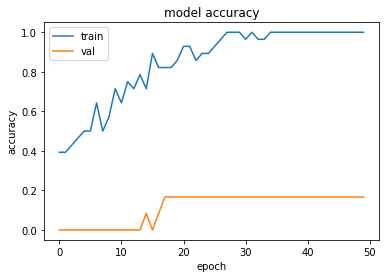

In [153]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

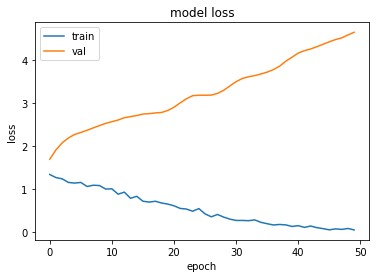

In [154]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [155]:
sequence_model.summary()

Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_41 (InputLayer)          [(None, 512, 2048)]  0           []                               
                                                                                                  
 input_42 (InputLayer)          [(None, 512)]        0           []                               
                                                                                                  
 gru_23 (GRU)                   (None, 512, 32)      199872      ['input_41[0][0]',               
                                                                  'input_42[0][0]']               
                                                                                                  
 gru_24 (GRU)                   (None, 32)           6336        ['gru_23[0][0]']          

Test video path: Drop_Rd_Kinect_Rgb7.m4v
  Drop: 33.06%
  Open: 26.92%
  Pour: 22.38%
  Rotate: 17.65%



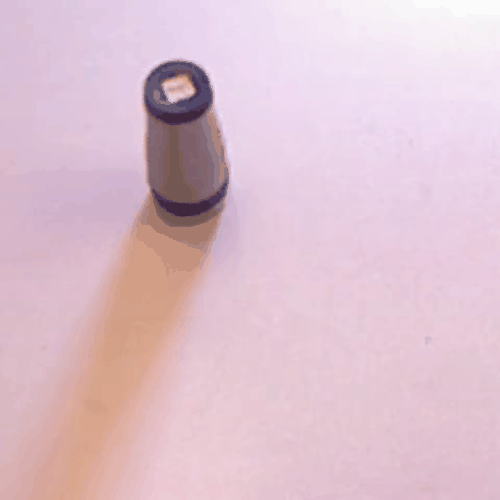

In [156]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask


def sequence_prediction(path):
    class_vocab = label_processor.get_vocabulary()

    frames = load_video(os.path.join("test", path))
    frame_features, frame_mask = prepare_single_video(frames)
    probabilities = sequence_model.predict([frame_features, frame_mask])[0]

    for i in np.argsort(probabilities)[::-1]:
        print(f"  {class_vocab[i]}: {probabilities[i] * 100:5.2f}%")
    return frames


# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")


test_video = np.random.choice(test_df["video_name"].values.tolist())
print(f"Test video path: {test_video}")
test_frames = sequence_prediction(test_video)
to_gif(test_frames[:MAX_SEQ_LENGTH])

In [161]:
sequence_model.save('myModel.h5')

In [162]:
from tensorflow import keras
sequence_model = keras.models.load_model('myModel.h5')

Test video path: Open_Hd_Kinect_Rgb7.m4v
  Open: 30.47%
  Drop: 29.85%
  Pour: 21.48%
  Rotate: 18.20%



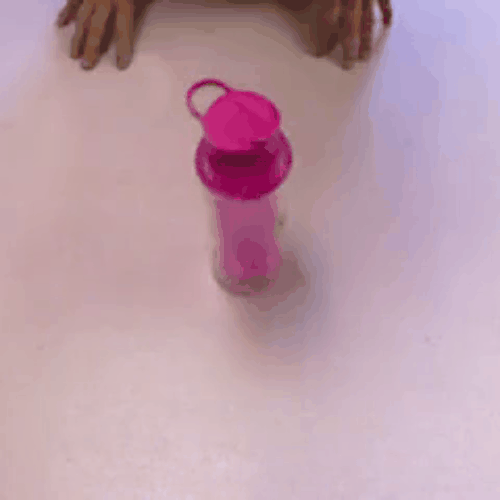

In [167]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask


def sequence_prediction(path):
    class_vocab = label_processor.get_vocabulary()

    frames = load_video(os.path.join("test", path))
    frame_features, frame_mask = prepare_single_video(frames)
    probabilities = sequence_model.predict([frame_features, frame_mask])[0]

    for i in np.argsort(probabilities)[::-1]:
        print(f"  {class_vocab[i]}: {probabilities[i] * 100:5.2f}%")
    return frames


# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")


test_video = np.random.choice(test_df["video_name"].values.tolist())
print(f"Test video path: {test_video}")
test_frames = sequence_prediction(test_video)
to_gif(test_frames[:MAX_SEQ_LENGTH])